# <font color=green>deepBreaks Applications</font>
## Modeling spectral tuning sites of opsin proteins based on amino-acid sequence...  

# <font color=red>Step 0: mySQL DB Setup -</font> Script 0
## *The following script sets up the schema for our vizphiz database.*
```

In [1]:
#All neccessary packages to import for data process steps.
#import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [2]:
# set the password of mySQL to local password
pwd = "23333333" # your mySQL password

In [3]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  # password is the password registered for mySQL
  password= pwd)

mycursor = mydb.cursor()

try:
  mycursor.execute("DROP DATABASE vizphiz_db;")
  mydb.commit() 
except:
  "vizphiz_db does not yet exist!"
  pass

mycursor.execute("CREATE DATABASE vizphiz_db;")
mydb.commit() 

mycursor.execute("USE vizphiz_db;")
mydb.commit() 


mycursor.execute("""
CREATE TABLE msp
(
maxid int unsigned not null primary key,
genus varchar(50),
species varchar(50),
celltype varchar(50),
cellsubtype varchar(50),
lamdamax decimal(9,5),
error decimal(9,5),
chromophore varchar(50),
stage varchar(50),
opsinid int,
refid varchar(50)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE heterologous
(
hetid int unsigned not null primary key,
genus  varchar(50),
species varchar(50),
accession varchar(500),
mutations varchar(500),
lamdamax decimal(9,5),
error decimal(9,5),
cellculture varchar(50),
purification varchar(50),
spectrum varchar(50),
sourcetype varchar(50),
refid int,
notes varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE links
(
linkid int unsigned not null primary key,
accession varchar(500),
maxid int,
refid int,
evidence varchar(1000)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE search
(
searchid int unsigned not null primary key,
researcher varchar(50),
month int,
year int,
engine varchar(500),
keywords varchar(500)
);
""")
mydb.commit() 


mycursor.execute("""
CREATE TABLE opsins
(
opsinid int unsigned not null primary key,
genefamily varchar(50),
genenames varchar(50),
phylum varchar(25),
genus varchar(50),
species varchar(50),
db varchar(50),
accession varchar(500),
dna varchar(10000),
aa varchar(3333),
refid int
);
""")

mydb.commit()

mycursor.execute("""
CREATE TABLE refs
(
refid int,
doilink varchar(100),
searchid int
);
""")
mydb.commit()

mydb.close()

In [4]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

# <font color=red>STEP 0: Data Base Setup -</font> Script 1 - Import heterologous.tsv into mySQL


In [5]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz_db",
  password= pwd
)

#read file for data
# when read heterologous.tsv, the column of note should be deleted, and the first column of column name should be deleted
file1 = open('heterologous_n.tsv', 'r', encoding="utf8")
Lines = file1.readlines()

count1=0
for line in Lines:
    columns = line.split("\t")
    print(columns)
    mycursor = mydb.cursor()

    sql = "INSERT INTO vizphiz_db.heterologous (hetid, genus, species, accession, mutations, lamdamax, error, cellculture, purification, spectrum, sourcetype, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10], columns[11])
    # not new: val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10], columns[12])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")
    count1 = count1+1

['1', 'Tachyglossus', 'aculeatus', 'JX103830', '', '497.9', '1.1', 'HEK293T', '1D4 antibody', '', '', '116\n']
INSERT INTO vizphiz_db.heterologous (hetid, genus, species, accession, mutations, lamdamax, error, cellculture, purification, spectrum, sourcetype, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('1', 'Tachyglossus', 'aculeatus', 'JX103830', '', '497.9', '1.1', 'HEK293T', '1D4 antibody', '', '', '116\n')
1 record inserted.
['2', 'Tachyglossus', 'aculeatus', 'JX103830_N83D', 'N83D', '503.8', '1.5', 'HEK293T', '1D4 antibody', '', '', '116\n']
INSERT INTO vizphiz_db.heterologous (hetid, genus, species, accession, mutations, lamdamax, error, cellculture, purification, spectrum, sourcetype, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('2', 'Tachyglossus', 'aculeatus', 'JX103830_N83D', 'N83D', '503.8', '1.5', 'HEK293T', '1D4 antibody', '', '', '116\n')
1 record inserted.
['3', 'Tachyglossus', 'aculeatus', 'JX103830_T158A', 'T158A', '498', '1.3', 'H

# <font color=red>STEP 0: Data Base Setup -</font> Script 2 - Import opsindb.tsv into mySQL

In [6]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz_db",
  password= pwd
)

#read file for data
#opsindb_n: the opsin file that included new invertebrate data
file2 = open('opsindb_n.tsv', 'r',encoding="utf8")
Lines2 = file2.readlines()

count=0
for line in Lines2:
    columns = line.split("\t")

    mycursor = mydb.cursor()

    # column number modified with the current (Sep.8th) opsin db layout
    # Sep.9: added phylum to insert the opsinsdb
    sql = "INSERT INTO vizphiz_db.opsins (opsinid, genefamily, genenames, phylum, genus, species, db, accession, dna, aa, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[6], columns[7], columns[8], columns[9], columns[10], columns[11], columns[12])
    # not new: val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")
    count=count+1



INSERT INTO vizphiz_db.opsins (opsinid, genefamily, genenames, phylum, genus, species, db, accession, dna, aa, refid) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('1', 'LWS', '', 'Chordata', 'Acanthopagrus', 'butcheri', 'NCBI', 'DQ354578.1', 'GGACCCAATTACCACATTGCTCCACGATGGGTTTACAACCTTTCCACATGCTGGATGATTATTGTAGTCATCCTATCAGTCTTCACCAACGGTCTCGTGTTGGTGGCCACGGCAAAGTTCAAGAAACTCCGACACCCTCTGAACTGGATCTTAGTCAATCTCGCAATTGCTGATCTTGGAGAAACAGTTTTTGCCAGCACTATCAGTGTATGCAACCAGTATTTTGGTTACTTCATTCTCGGACACCCGATGTGCATCTTTGAGGGCTACACTGTCTCAGTTTGCGGAATTACTGCTCTCTGGTCCCTGACGATCATCTCCTGGGAGAGGTGGATAGTTGTGTGCAAACCTTTTGGAAACATCAAATTTGATGAAAAATGGGCCATAAGTGGAATAGTGTTCTCCTGGGTCTGGTCAGCAGTGTGGTGTGCTCCCCCCATCTTTGGATGGAGCAGGTACTGGCCTCATGGTCTGAAGACTTCCTGTGGCCCTGATGTATTCAGTGGAAGCGAAGACCCTGGCGTTCAGTCCTACATGGTTGTTCTTATGATCACATGTTGCTTGATTCCTCTGGCTATCATCATCTTATGCTATCTCGCAGTCTGGCTGGCCATCCGTGCAGTTGCCATGCAGCAGAAAGAGTCAGAGTCGACTCAGAAGGCCGAGAGAGAAGTATCCAGGATGGTTGTCGTCATGATCTTTGCATATTGCTTTTGTTGGGGTCCTTACACGTTTTTTGCCTGCTTTGC

# Import msp data from msp.tsv

In [7]:
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database= "vizphiz_db",
  password= pwd
)

#read file for data
#opsindb_n: the opsin file that included new invertebrate data
file2 = open('msp.tsv', 'r',encoding="utf8")
Lines2 = file2.readlines()

count=0
for line in Lines2:
    columns = line.split("\t")

    mycursor = mydb.cursor()

    # column number modified with the current (Sep.8th) opsin db layout
    # Sep.9: added phylum to insert the opsinsdb
    sql = "INSERT INTO vizphiz_db.msp (maxid, genus, species, celltype, cellsubtype, lamdamax, error, chromophore, stage, opsinid, refid) VALUES ( %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"
    val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9], columns[10])
    # not new: val = (columns[0], columns[1], columns[2], columns[3], columns[4], columns[5], columns[6], columns[7], columns[8], columns[9])
    print(sql)
    print(val)

    mycursor.execute(sql, val)

    mydb.commit()

    print(mycursor.rowcount, "record inserted.")
    count=count+1





INSERT INTO vizphiz_db.msp (maxid, genus, species, celltype, cellsubtype, lamdamax, error, chromophore, stage, opsinid, refid) VALUES ( %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('1', 'Acipenser', 'transmontanus', 'rod', '', '540', '0', '', 'adult', '463', '30\n')
1 record inserted.
INSERT INTO vizphiz_db.msp (maxid, genus, species, celltype, cellsubtype, lamdamax, error, chromophore, stage, opsinid, refid) VALUES ( %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('2', 'Acipenser', 'transmontanus', 'cone', '', '464', '0', '', 'adult', '0', '30\n')
1 record inserted.
INSERT INTO vizphiz_db.msp (maxid, genus, species, celltype, cellsubtype, lamdamax, error, chromophore, stage, opsinid, refid) VALUES ( %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
('3', 'Acipenser', 'transmontanus', 'cone', '', '531', '0', '', 'adult', '0', '30\n')
1 record inserted.
INSERT INTO vizphiz_db.msp (maxid, genus, species, celltype, cellsubtype, lamdamax, error, chromophore, stage, opsinid, refid) VALUES ( %s, %s, 

In [8]:
# check invertebrate data
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database="vizphiz_db",
  password=pwd
) 
mycursor = mydb.cursor()

sql = "select o.genus,o.species,o.genefamily,o.accession,o.aa,o.phylum from vizphiz_db.opsins as o "
mycursor.execute(sql)
myresult1 = mycursor.fetchall()

len(myresult1)

2473

# <font color=red>STEP 1: Extract Data From Vizphiz</font>
### Output = 8 different 'versions' // 'splits' of the data. 
2. Strategy = FFT-NS-2 // G-INS-1

In [9]:
#All neccessary packages to import for data process steps.
import mysql
import mysql.connector
#install mysql-connector-python // NOT mysql-connector
import re
import os
import datetime 
import subprocess
import shutil 

In [10]:
# create seperation sets by invertebrate/vertebrate, rodopsin and others (?)
# need revisit for the invertebrate division part
inv = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
rod = re.compile('Rh[0-2]|exoRh')
d = re.compile("^NM_001014890.2$|^NM_001014890$")
iec = re.compile("Limenitis|Papilio|Drosophila")

In [11]:
#directory preperation
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seq_report_dir = str(f'vizphiz_data_splits_{dt_label}')
os.makedirs(seq_report_dir)

wd_output = f'{seq_report_dir}/wds.txt'
sws_output = f'{seq_report_dir}/swd.txt'
mws_output = f'{seq_report_dir}/mwd.txt'
rod_output = f'{seq_report_dir}/rod.txt'
wd_ni_output = f'{seq_report_dir}/wds_ni.txt'
inv_output = f'{seq_report_dir}/inv_only.txt'
nmoc_output = f'{seq_report_dir}/nmoc.txt'
mut_output = f'{seq_report_dir}/mut_only.txt'
wh_metadata = f'{seq_report_dir}/wds_meta.tsv'
sw_metadata = f'{seq_report_dir}/sws_meta.tsv'
mw_metadata = f'{seq_report_dir}/mws_meta.tsv'
rh_metadata = f'{seq_report_dir}/rod_meta.tsv'
wd_ni_metadata = f'{seq_report_dir}/wds_ni_meta.tsv'
inv_metadata = f'{seq_report_dir}/inv_meta.tsv'
nmoc_metadata = f'{seq_report_dir}/nmoc_meta.tsv'
mut_metadata = f'{seq_report_dir}/mut_meta.txt'

meta_data_list = [wh_metadata,sw_metadata,mw_metadata,rh_metadata,wd_ni_metadata,inv_metadata,nmoc_metadata]

m = 0
s = 0
l = 0
r = 0
c = 0
z = 0
q = 0
mut = 0


In [12]:
# minor change in selecting invertebrate samples
mydb = mysql.connector.connect(
  host="localhost",
  user="root",
  database="vizphiz_db",
  password=pwd
) 
mycursor = mydb.cursor()

# error in sql part in my first run
# 1049 (42000): Unknown database 'opsins'
# version before edit:
# select DISTINCT o.genus,o.species,o.genefamily,o.accession,h.lamdamax,o.aa,o.phylum from opsins.opsins o, opsins.heterologous h WHERE (o.accession = h.accession AND o.refid = h.refid); 

# since in some new added data, the opsin refid and the heterologous refid might be different, and refid equals part was deleted
sql = """(select DISTINCT o.genus,o.species,o.genefamily,o.accession,h.lamdamax,o.aa,o.phylum 
from vizphiz_db.opsins as o, vizphiz_db.heterologous as h 
WHERE (o.accession = h.accession) 
) 
Union (
  select DISTINCT o.genus,o.species,o.genefamily,o.accession,m.lamdamax,o.aa,o.phylum from vizphiz_db.opsins as o, vizphiz_db.msp as m 
  WHERE (o.opsinid = m.opsinid)); """

mycursor.execute(sql)
myresult = mycursor.fetchall()

#x[6]!= "Chordata"

print(len(myresult))


for x in myresult:  

  if (x[4] == 0):
    pass   
  else:  
  #REG-DATA SECTION    
    with open(wd_output, 'a') as f:
      if m == 0:
        f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
      if (d.match(x[3])):
        pass
      else:
        m += 1 
        #This makes the fasta format file
        seq = ">S" + str(m)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(wd_ni_output, 'a') as f:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
        pass
      else:
        if c == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        c += 1 
        #This makes the fasta format file
        seq = ">S" + str(c)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(inv_output, 'a') as f:
      if (x[6]!= "Chordata"):
        if q == 0:
          f.write(">Squid\nMGRDLRDNETWWYNPSIVVHPHWREFDQVPDAVYYSLGIFIGICGIIGCGGNGIVIYLFTKTKSLQTPANMFIINLAFSDFTFSLVNGFPLMTISCFLKKWIFGFAACKVYGFIGGIFGFMSIMTMAMISIDRYNVIGRPMAASKKMSHRRAFIMIIFVWLWSVLWAIGPIFGWGAYTLEGVLCNCSFDYISRDSTTRSNILCMFILGFFGPILIIFFCYFNIVMSVSNHEKEMAAMAKRLNAKELRKAQAGANAEMRLAKISIVIVSQFLLSWSPYAVVALLAQFGPLEWVTPYAAQLPVMFAKASAIHNPMIYSVSHPKFREAISQTFPWVLTCCQFDDKETEDDKDAETEIPAGESSDAAPSADAAQMKEMMAMMQKMQQQQAAYPPQGYAPPPQGYPPQGYPPQGYPPQGYPPQGYPPPPQGAPPQGAPPAAPPQGVDNQAYQA\n")
        q += 1 
        #This makes the fasta format file
        seq = ">S" + str(q)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)
      else:
        pass

    with open(nmoc_output, 'a') as f:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        pass
      else:
        if z == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          z += 1 
          #This makes the fasta format file
          seq = ">S" + str(z)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

    with open(mut_output, 'a') as f:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        if mut == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if(d.match(x[3])):
          pass
        else:
          mut += 1 
          #This makes the fasta format file
          seq = ">M" + str(mut)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)
      else:
        pass

    with open(sws_output, 'a') as f:
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        s+=1
        if s == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")  
      #This makes the fasta format file
        seq = ">S" + str(s)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(mws_output, 'a') as f:
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        l+=1
        if l == 1:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        #This makes the fasta format file
        seq = ">S" + str(l)
        f.write(seq)
        seq2 = str('\n' + x[5] + '\n')
        f.write(seq2)

    with open(rod_output, 'a') as f:
      p = re.compile('Rh[0-2]|exoRh')
      if p.match(x[2]):
        if r == 0:
          f.write(">Bovine\nMNGTEGPNFYVPFSNKTGVVRSPFEAPQYYLAEPWQFSMLAAYMFLLIMLGFPINFLTLYVTVQHKKLRTPLNYILLNLAVADLFMVFGGFTTTLYTSLHGYFVFGPTGCNLEGFFATLGGEIALWSLVVLAIERYVVVCKPMSNFRFGENHAIMGVAFTWVMALACAAPPLVGWSRYIPEGMQCSCGIDYYTPHEETNNESFVIYMFVVHFIIPLIVIFFCYGQLVFTVKEAAAQQQESATTQKAEKEVTRMVIIMVIAFLICWLPYAGVAFYIFTHQGSDFGPIFMTIPAFFAKTSAVYNPVIYIMMNKQFRNCMVTTLCCGKNPLGDDEASTTVSKTETSQVAPA\n")
        if (inv.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
          pass
        else:
          r+=1
          #This makes the fasta format file
          seq = ">S" + str(r)
          f.write(seq)
          seq2 = str('\n' + x[5] + '\n')
          f.write(seq2)

  #METADATA SECTION
    with open(wh_metadata, 'a') as g:
      if m == 1:
        g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
        g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")
      if (d.match(x[3])):
        pass
      else:        
        md =  str("S" + str(m) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(wd_ni_metadata, 'a') as g:
      p = re.compile('^Rtc|^BRh[0-3]|Pr[A-Z]|Rh1,Rh3|^IV|^inv')
      if (p.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
        pass
      else:
        if c == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_tarus\tRh1\tNM_001014890\n")

        md =  str("S" + str(c) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(inv_metadata, 'a') as g:
      if (x[6]!= "Chordata"):
        if q == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Squid\t473.0000\tTodarodes_pacificus\tRh1\tX70498\n")

        md =  str("S" + str(q) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)
      else:
        pass
          
    with open(sw_metadata, 'a') as g:
    #This makes the metadata formatted for a linear regression model.
      p = re.compile('^SWS|^UVS')
      if p.match(x[2]):
        if s == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(s) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(mw_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('^MWS|^LWS')
      if p.match(x[2]):
        if l == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")  
        md =  str("S" + str(l) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
        g.write(md)

    with open(rh_metadata, 'a') as g:
      #This makes the metadata formatted for a linear regression model.
      p = re.compile('Rh[0-3]|exoRh')

      if p.match(x[2]):
        if r == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if (inv.match(x[2]) or d.match(x[3]) or iec.match(x[0])):
          pass
        else:  
          md =  str("S" + str(r) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(nmoc_metadata, 'a') as g:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        pass
      else:
        if z == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("S" + str(z) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)

    with open(mut_metadata, 'a') as g:
      p = re.compile('[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T][0-9]+[G,A,L,M,F,W,K,Q,E,S,P,V,I,C,Y,H,R,N,D,T]')
      if (p.search(x[3]) or "-" in x[3]):
        if mut == 1:
          g.write("\tLambda_Max\tSpecies\tOpsin_Family\tAccession\n")  
          g.write("Bovine\t500.0000\tBos_taurus\tRh1\tNM_001014890\n")
        if(d.match(x[3])):
          pass
        else:        
          md =  str("M" + str(mut) + "\t" + str(x[4]).strip()) + "\t" + str(x[0]).strip().replace(' ','') + "_" + str(x[1]).strip().replace(' ','') + "\t" + str(x[2]).strip() + "\t" + x[3].strip() + "\n"
          g.write(md)
      else:
        pass


930


In [13]:
mut_only = open(mut_output).readlines()
mut_nmoc = f'{seq_report_dir}/nmoc_mut_added.txt'
shutil.copy(nmoc_output , mut_nmoc)
x = 0
for lines in mut_only:
  if x <= 1:
    if x == 0:
      with open(mut_nmoc, 'a') as m:
        m.write('\n')
    else:
      pass
    x+=1
  else:
    with open(mut_nmoc, 'a') as m:
      m.write(lines)

# <font color=red>STEP 2: Align Raw Data and Format for 'deepBreaks'</font>
## REMINDER - You will need to change the directory for the 'mafft_exe' variable to the one of your own operating system!


In [14]:
# set up the mafft's directory
# original address: 'C:/Users/safra/mafft-win/mafft.bat' 
mafft_dir = "/Users/yw/Desktop/opsin_project/mafft-mac/mafft.bat"

In [15]:
from Bio.Align.Applications import MafftCommandline
from Bio import AlignIO

data_split_list = [wd_output,sws_output,mws_output,rod_output,wd_ni_output,inv_output,nmoc_output,mut_nmoc,mut_output]
output_list = []
mafft_exe = mafft_dir

for data in data_split_list:
    output = f'{data.split(".")[0]}_aligned.txt'
    mafft_cline = MafftCommandline(mafft_exe, input=f'./{data}')
    #print(mafft_cline)
    stdout, stderr = mafft_cline()

    with open(output, "w") as handle:
        handle.write(stdout)
        #print(handle)
    align = AlignIO.read(output, "fasta")
    output_list.append(f'{output}')


In [16]:
print(output_list)

for item in output_list:
    output = item.split('.')[0]
    print(output)

['vizphiz_data_splits_2023-10-12_20-37-05/wds_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/swd_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/mwd_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/rod_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/wds_ni_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/nmoc_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/nmoc_mut_added_aligned.txt', 'vizphiz_data_splits_2023-10-12_20-37-05/mut_only_aligned.txt']
vizphiz_data_splits_2023-10-12_20-37-05/wds_aligned
vizphiz_data_splits_2023-10-12_20-37-05/swd_aligned
vizphiz_data_splits_2023-10-12_20-37-05/mwd_aligned
vizphiz_data_splits_2023-10-12_20-37-05/rod_aligned
vizphiz_data_splits_2023-10-12_20-37-05/wds_ni_aligned
vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned
vizphiz_data_splits_2023-10-12_20-37-05/nmoc_aligned
vizphiz_data_splits_2023-10-12_20-37-05/nmoc_mut_added_aligned
vizphiz

In [17]:
#enter list of aligned text files here.
inputs = output_list
deep_breaks_input_data = []
# inputs = ['wds_aligned.txt','wds_ni_aligned.txt','rod_aligned.txt','nmoc_aligned.txt']
##enter list of names for desired formatted fasta files here.
# output = ['wds_fmt.fasta','wds_ni_fmt.fasta','rod_fmt.fasta','nmoc_fmt.fasta']
i=0
k = 0
for item in inputs:
    print(item)
    lines = open(inputs[i]).readlines()
    output = f'./{inputs[i].split(".")[0]}_db_fmt.fasta'
    deep_breaks_input_data.append(output)
    print(output)
    file = open(output, 'w')
    m=0
    for line in lines:
        snip = str(lines[k])
        if '>' in snip:
            if m == 0:
                m+=1
            else:
                file.write("\n")
            file.write(snip)
        else:
            entry = ""
            entry = str(snip.replace("\n",""))
            file.write(entry)
        k+=1
    k = 0
    i+=1
    file.close()

vizphiz_data_splits_2023-10-12_20-37-05/wds_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/wds_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/swd_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/swd_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/mwd_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/mwd_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/rod_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/rod_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/wds_ni_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/wds_ni_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/nmoc_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/nmoc_aligned_db_fmt.fasta
vizphiz_data_splits_2023-10-12_20-37-05/nmoc_mut_added_aligned.txt
./vizphiz_data_splits_2023-10-12_20-37-05/nmoc_mut_add

In [18]:
print(deep_breaks_input_data)

['./vizphiz_data_splits_2023-10-12_20-37-05/wds_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/swd_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/mwd_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/rod_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/wds_ni_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/nmoc_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/nmoc_mut_added_aligned_db_fmt.fasta', './vizphiz_data_splits_2023-10-12_20-37-05/mut_only_aligned_db_fmt.fasta']


# <font color=red>STEP 3: deepBreaks</font>
## THIS IS A LONG SECTION! 
### STEP 4 doesn't start until Cell 34

In [19]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare
from deepBreaks.preprocessing import read_data
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all
from deepBreaks.preprocessing import write_fasta
import warnings
import datetime
import os
import shutil 

In [20]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [22]:
deep_breaks_input_data[5]

'./vizphiz_data_splits_2023-10-12_20-37-05/inv_only_aligned_db_fmt.fasta'

In [23]:
# Aug 11, Yinghui's Local test with rod opsin
# changes: seqFileName, metaDataFileName

# 2023-09-08: Yinghui's 2nd Local test with inv opsin
# changes: seqFileName, metaDataFileName

# 2023-09-08: Yinghui's 2nd Local test with inv opsin
# changes: seqFileName, metaDataFileName

#vizphiz_data_splits_2023-09-09_17-16-48: 3rd test with new data

#deep_breaks_input_data[5]: 2023-10-12_20-37-05, test with additional msp data


# defining user params, file pathes, analysis type

# both path updated with local version

# path to sequences
seqFileName = deep_breaks_input_data[5]
#find way to automatically save aligned file to report directory and then have unaligned sequence align to file via mafft wapper and thennn run the hot-encode step to query model on correctly formatted seq.
# path to metadata
metaDataFileName = './vizphiz_data_splits_2023-10-12_20-37-05/inv_meta.tsv' 

# name of the phenotype
mt = 'Lambda_Max'

# type of the sequences
seq_type = 'aa'

# type of the analysis if it is a classification model, then we put cl instead of reg
ana_type = 'reg' 


In [24]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('/')[2]
#print(seqFile)
seqFile = seqFile.split('.')[0]
#print(seqFile)
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [25]:
%%time
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)
# importing sequences data
print('reading fasta file')

tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.6)
msp = tr.copy()

shutil.copy2(f'{seqFileName}',report_dir)
write_fasta(dat = tr, fasta_file = f'{seqFile}_gap_dropped.fasta' , report_dir = report_dir)
 


reading meta-data
reading fasta file
inv_only_aligned_db_fmt_gap_dropped.fasta was saved successfully
CPU times: user 62.2 ms, sys: 13.5 ms, total: 75.7 ms
Wall time: 77.2 ms


In [26]:
tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True)
tr.shape

(160, 393)

In [27]:
tr.head()

,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p384,p385,p386,p387,p388,p389,p390,p391,p392,Lambda_Max
Squid,NaN,NaN,NaN,NaN,M,G,R,D,L,R,...,Q,M,K,E,Q,Q,Q,A,A,473.0
S1,NaN,NaN,NaN,NaN,M,A,L,N,Y,L,...,V,NaN,C,E,E,K,A,P,A,571.0
S2,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,V,NaN,C,E,E,K,P,S,A,540.0
S3,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,V,NaN,C,E,E,K,P,S,A,538.0
S4,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,V,NaN,C,E,E,K,P,S,A,542.0


In [28]:
import numpy as np
import csv
import pandas as pd

In [29]:
# shape of the data: position aligned after the gap drop
y = tr.loc[:, mt].values
tr.drop(mt, axis=1, inplace=True)
print('Shape of data is: ', tr.shape)

Shape of data is:  (160, 392)


In [30]:
try:
    reference_seq = tr.loc['Bovine'].copy()
    ref_seq_name = 'bovine'
    #print(bovine)
except:
    reference_seq = tr.loc['Squid'].copy()
    ref_seq_name = 'squid'
    #print(squid)
reference_seq.to_csv(path_or_buf= f'{report_dir}/ref_sequence.csv',index = True,mode="w")

**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [31]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Lambda_Max,Species,Opsin_Family,Accession
Squid,473.0,Todarodes_pacificus,Rh1,X70498
S1,571.0,Papilio_xuthus,Rh3,AB007425.1
S2,540.0,Papilio_xuthus,Rh1,AB007423.1
S3,538.0,Papilio_xuthus,"Rh1,Rh3",AB007423.1_1_58-AB007425.1_59_83-AB007423.1_84...
S4,542.0,Papilio_xuthus,"Rh1,Rh3",AB007423.1_1_58-AB007425.1_59_83-AB007423.1_84...


In [32]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p383,p384,p385,p386,p387,p388,p389,p390,p391,p392
Squid,NaN,NaN,NaN,NaN,M,G,R,D,L,R,...,A,Q,M,K,E,Q,Q,Q,A,A
S1,NaN,NaN,NaN,NaN,M,A,L,N,Y,L,...,A,V,NaN,C,E,E,K,A,P,A
S2,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,A,V,NaN,C,E,E,K,P,S,A
S3,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,A,V,NaN,C,E,E,K,P,S,A
S4,NaN,NaN,NaN,NaN,M,A,M,D,S,L,...,A,V,NaN,C,E,E,K,P,S,A


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [33]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=False)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=False))
    ])

In [34]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir,
                               cv=12, ana_type=ana_type, cache_dir=report_dir)

Fitting rf...
Fitting Adaboost...
Fitting et...
Fitting gbc...
Fitting dt...
Fitting lr...
Fitting Lasso...
Fitting LassoLars...
Fitting BayesianRidge...
Fitting HubR...
Fitting lgbm...
Fitting xgb...
CPU times: user 959 ms, sys: 622 ms, total: 1.58 s
Wall time: 20.4 s


MAE = Mean Absolute Error

MSE = Mean Squared Error

RMSE = Rooted Mean Square Error

MAPE = Mean Absolute % Error - the average magnitude of error produced by a model, or how far off predictions are on average. A MAPE value of 20% means that the average absolute percentage difference between the predictions and the actuals is 20%

In [35]:
report

,R2,MAE,MSE,RMSE,MAPE
LassoLars,7.836545e-01,1.875490e+01,9.173075e+02,2.832838e+01,4.144257e-02
Lasso,7.836215e-01,1.875578e+01,9.174263e+02,2.833033e+01,4.144416e-02
BayesianRidge,7.709295e-01,1.920046e+01,9.804312e+02,2.895192e+01,4.253155e-02
gbc,7.669707e-01,1.714113e+01,9.688316e+02,2.889612e+01,3.761193e-02
rf,7.653299e-01,1.755049e+01,9.937025e+02,2.921610e+01,3.873997e-02
lgbm,7.635743e-01,1.810541e+01,1.002649e+03,2.947369e+01,4.044861e-02
HubR,7.601751e-01,1.710121e+01,1.017127e+03,2.812050e+01,3.632058e-02
xgb,7.241532e-01,1.809620e+01,1.129932e+03,3.095637e+01,3.973496e-02
et,7.227046e-01,1.890459e+01,1.128647e+03,3.132754e+01,4.083491e-02
dt,7.038539e-01,1.905731e+01,1.190001e+03,3.201472e+01,4.076759e-02


In [36]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.025)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.10, keep=True)),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.05, keep=True))
    ])

In [37]:
modified_top = []
mtml = []
for model in top:
    modified_top.append(make_pipeline(steps=[('prep', prep_pipeline), model.steps[-1]]))
    my_top_models = str(model[1:])
    #print(my_top_models)
    my_top_models = my_top_models.split("'")[3]
    mtml.append(my_top_models)
    #print(my_top_models)

In [38]:
modified_top[0]

Pipeline(steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.025)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.1, keep=True,
                                                   model_type='reg')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.05))])),
                ('LassoLars', LassoLars(random_state=123))])

In [39]:
%%time
top = finalize_top(X=tr, y=y, top_models=modified_top, grid_param=get_params(),report_dir=report_dir, cv=10)


Tuning LassoLars...
Tuning Lasso...


/Users/yw/anaconda3/envs/deepBreaks_env/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.460e+03, tolerance: 6.001e+01
  model = cd_fast.enet_coordinate_descent(
/Users/yw/anaconda3/envs/deepBreaks_env/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.033e+03, tolerance: 5.664e+01
  model = cd_fast.enet_coordinate_descent(
/Users/yw/anaconda3/envs/deepBreaks_env/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the featu

Tuning BayesianRidge...
CPU times: user 12.2 s, sys: 1.89 s, total: 14.1 s
Wall time: 22.9 s


In [40]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: user 466 ms, sys: 26.4 ms, total: 493 ms
Wall time: 528 ms


In [41]:
sr.head()

,feature,p_value,score,LassoLars,Lasso,BayesianRidge,mean
0,p1_E,1.938859e-08,35.046606,0.0,0.00000,0.161253,0.053751
1,p1_GAP,5.352339e-14,68.308281,0.0,0.28826,0.304540,0.197600
2,p1_H,1.036361e-02,6.731506,0.0,0.00000,0.017065,0.005688
3,p1_KLTRF,7.992751e-04,11.690623,0.0,0.00000,0.087115,0.029038
4,p1_M,3.535528e-01,0.865754,0.0,0.00000,0.000000,0.000000


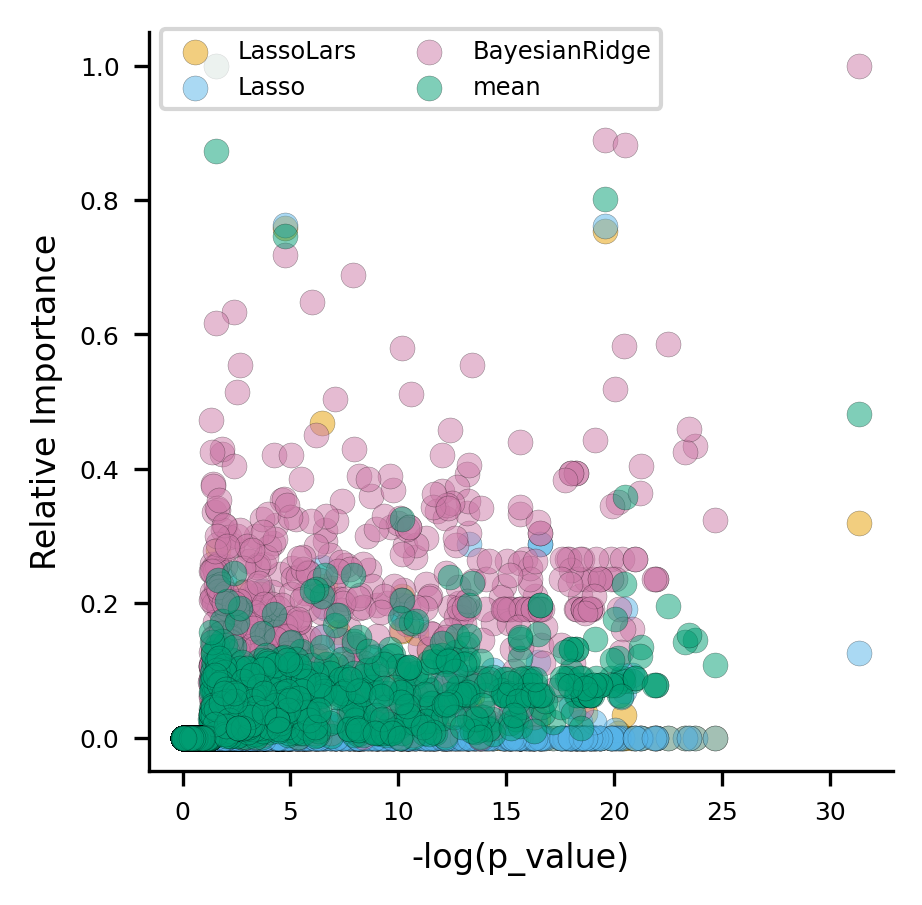

In [42]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [43]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir)

CPU times: user 76.9 ms, sys: 7.95 ms, total: 84.9 ms
Wall time: 86.6 ms


mean Done


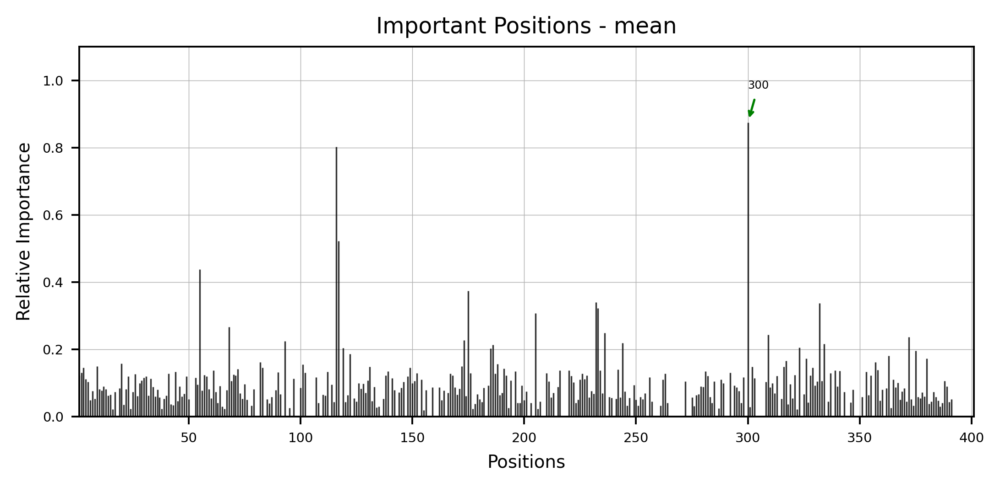

In [44]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir)

In [45]:
tr = prep_pipeline[:4].fit_transform(tr)

LassoLars Done
LassoLars  Done
Lasso Done
Lasso  Done
BayesianRidge Done
BayesianRidge  Done


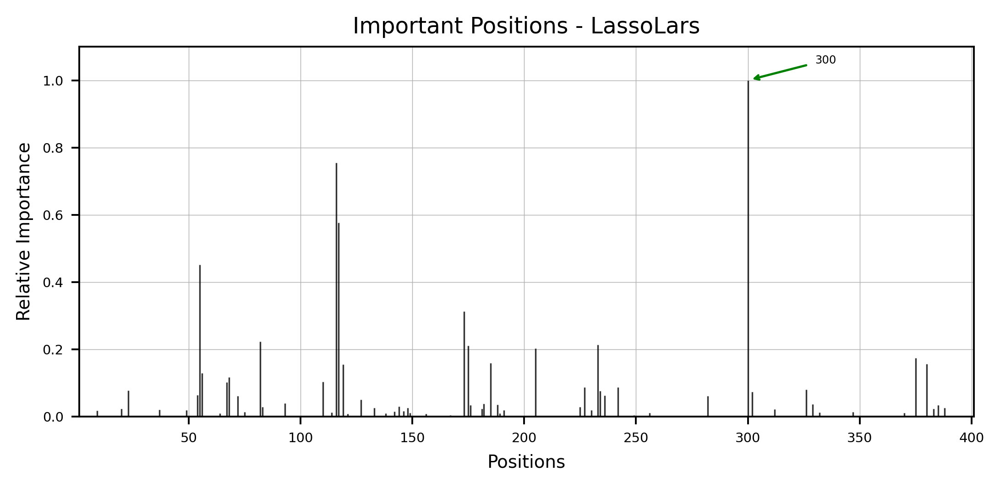

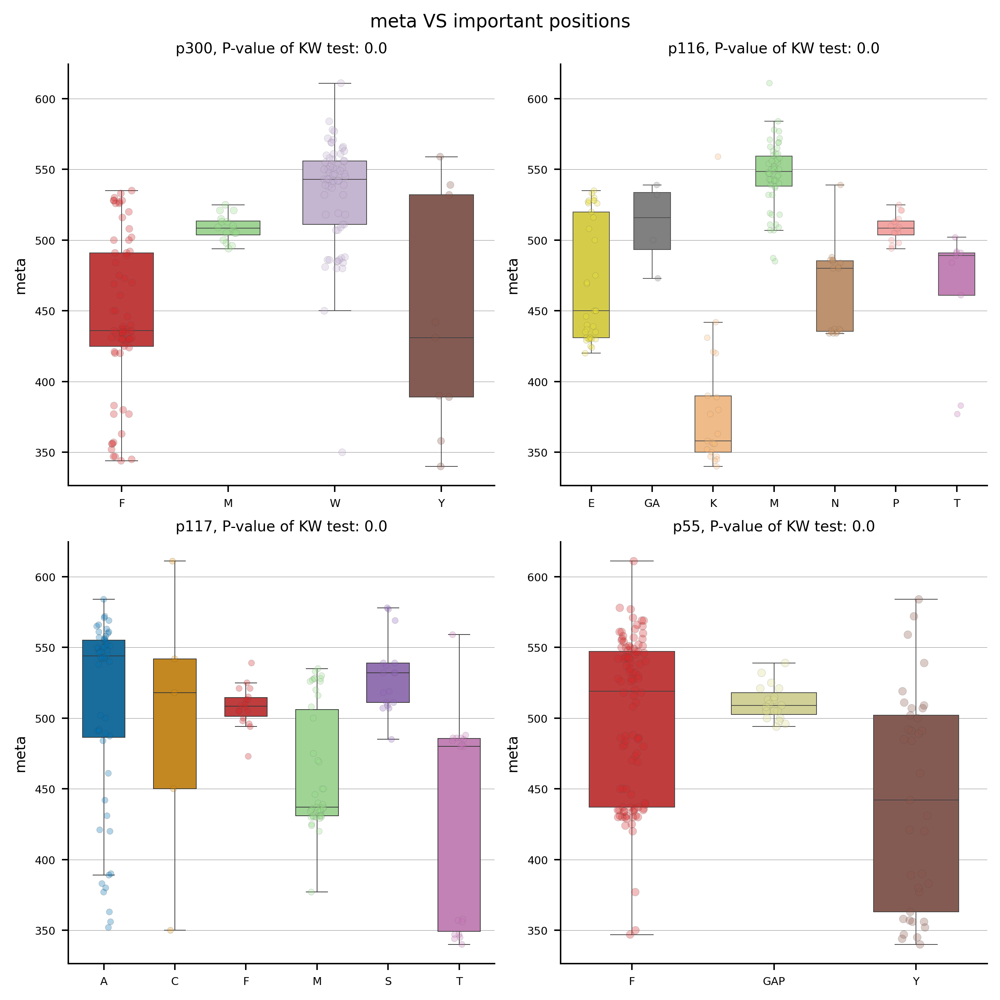

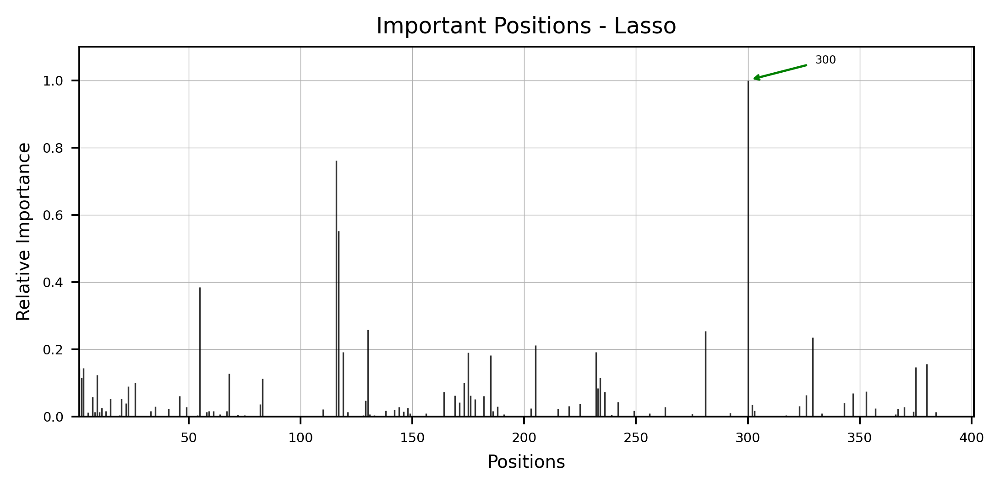

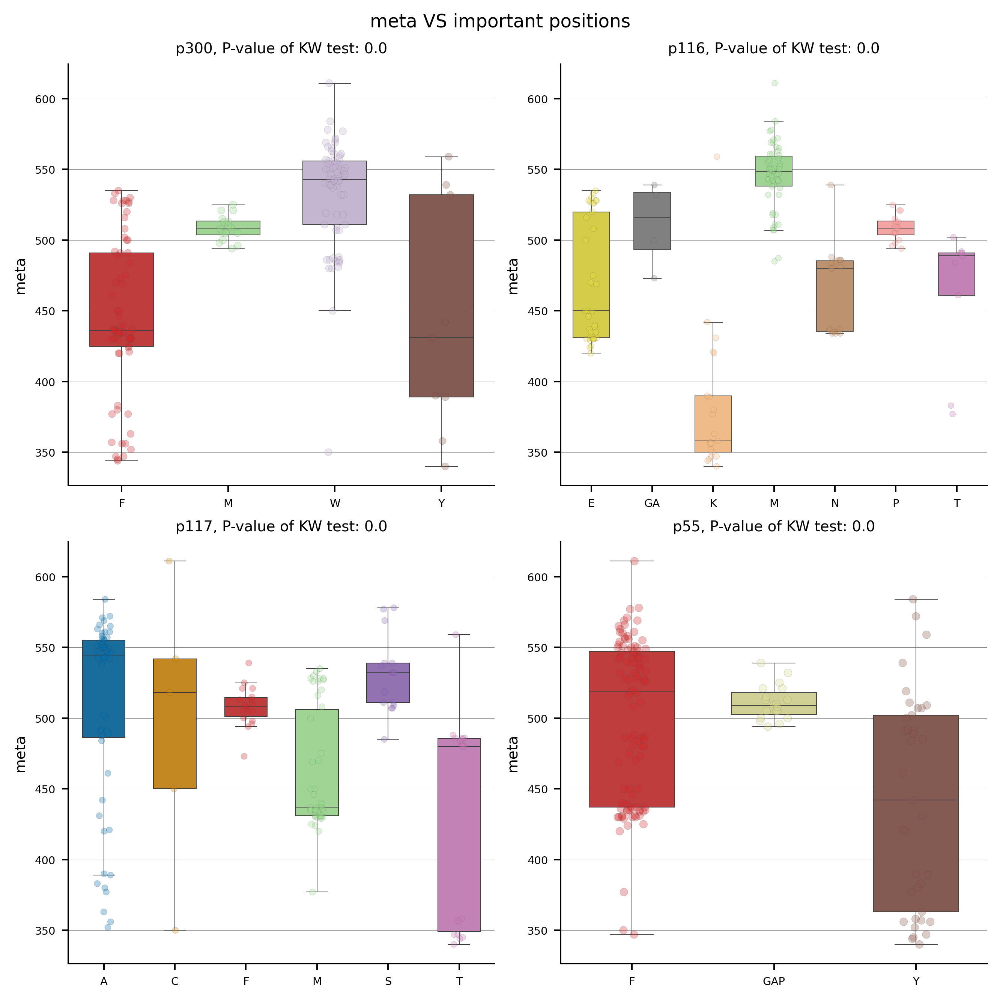

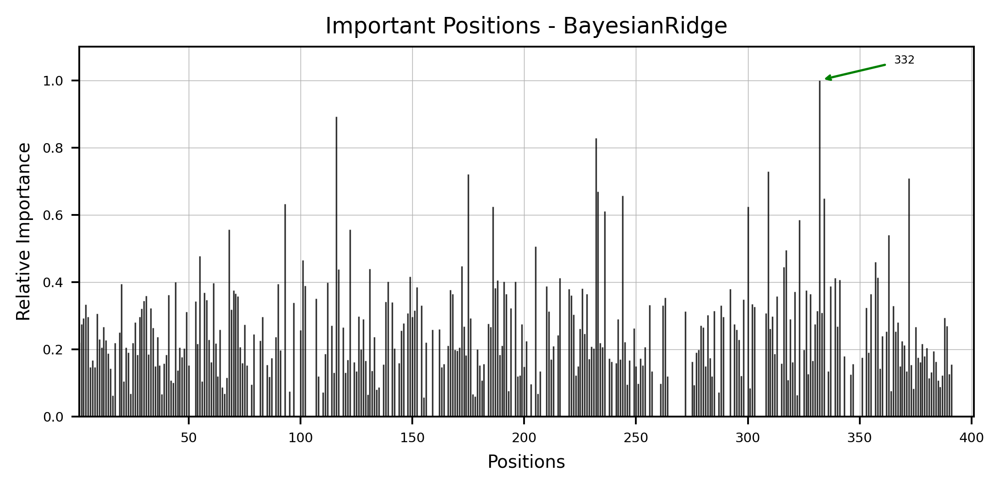

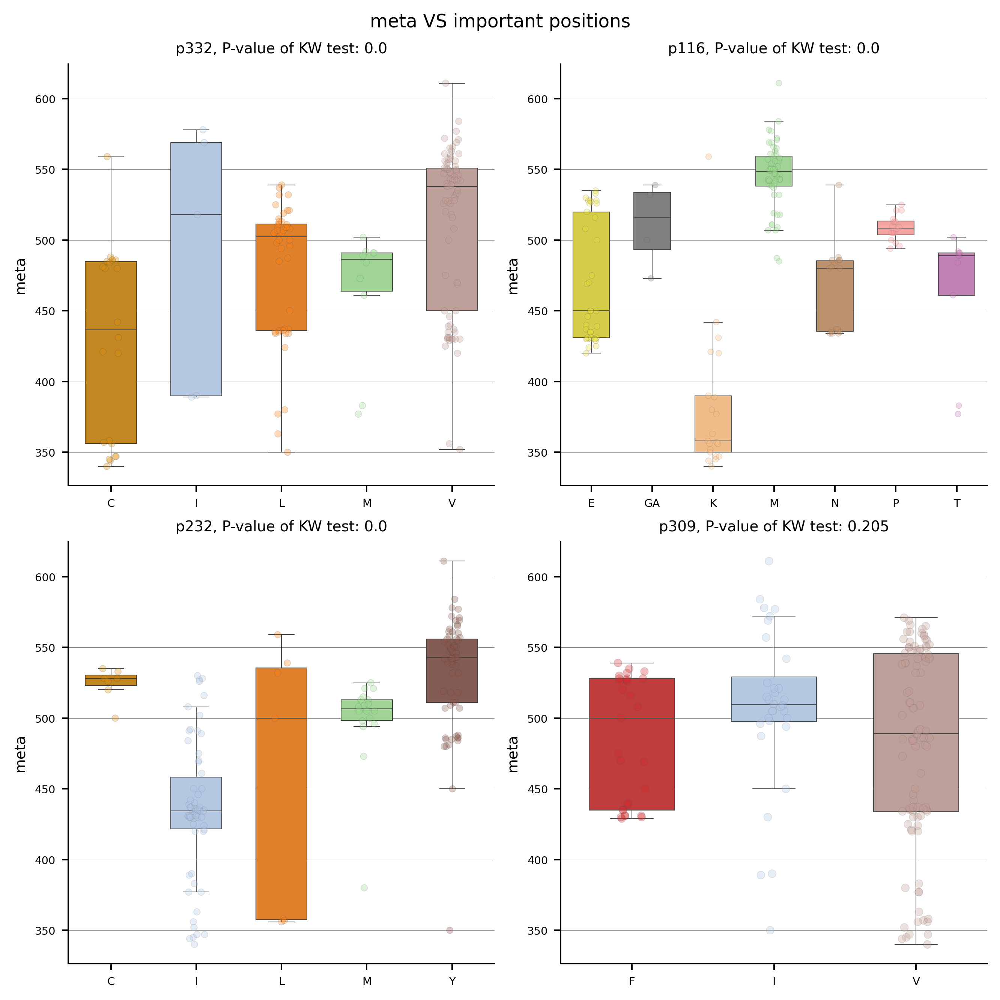

In [46]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model),
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model), 
               X_train=tr, y_train=y, model_name=model_name,
                   meta_var='meta', model_type=ana_type, report_dir=report_dir)

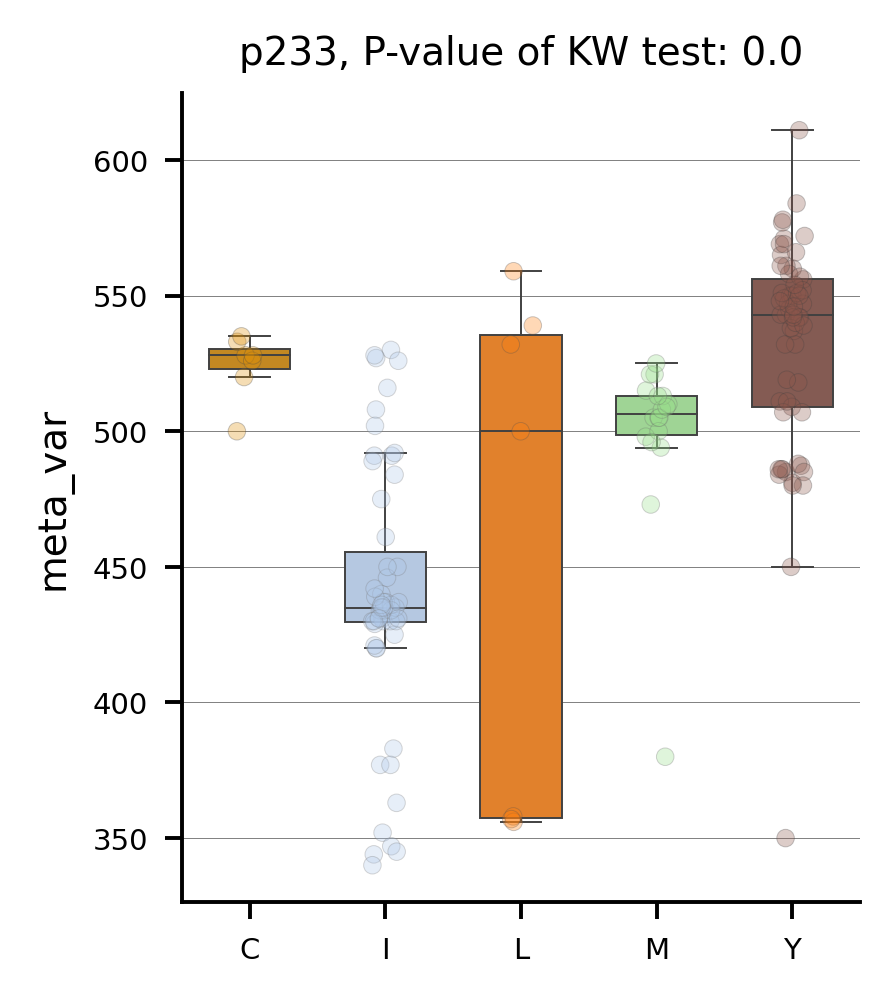

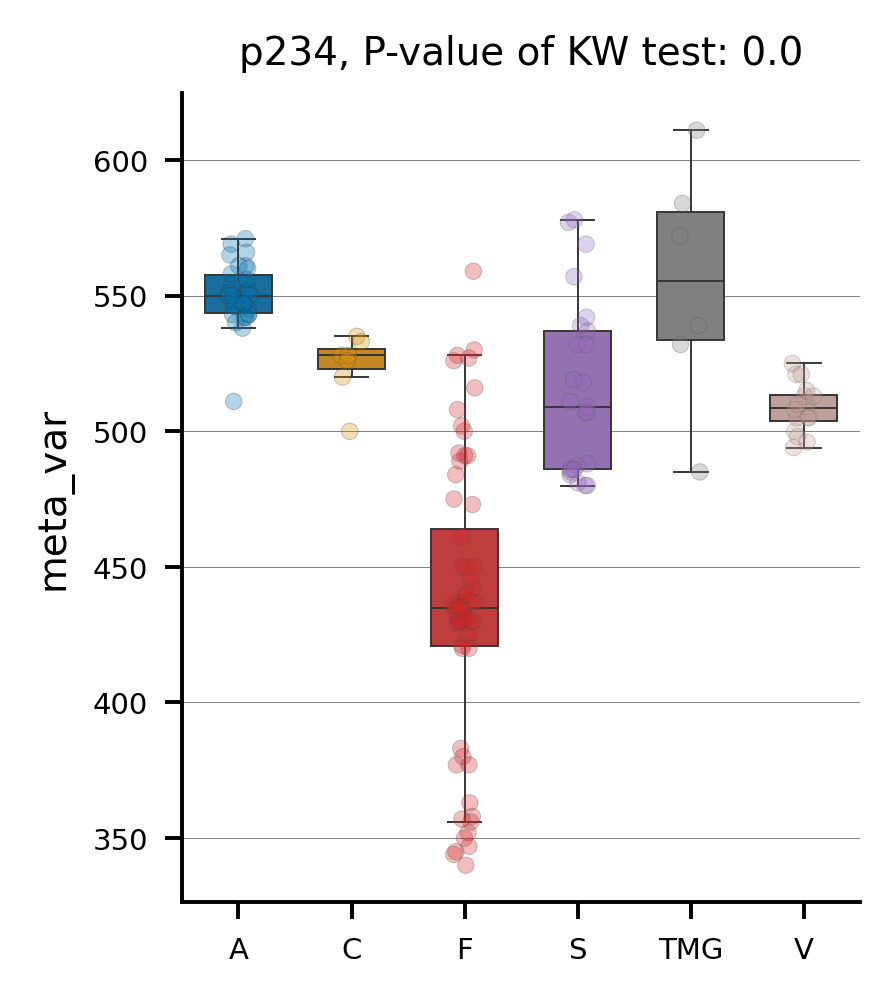

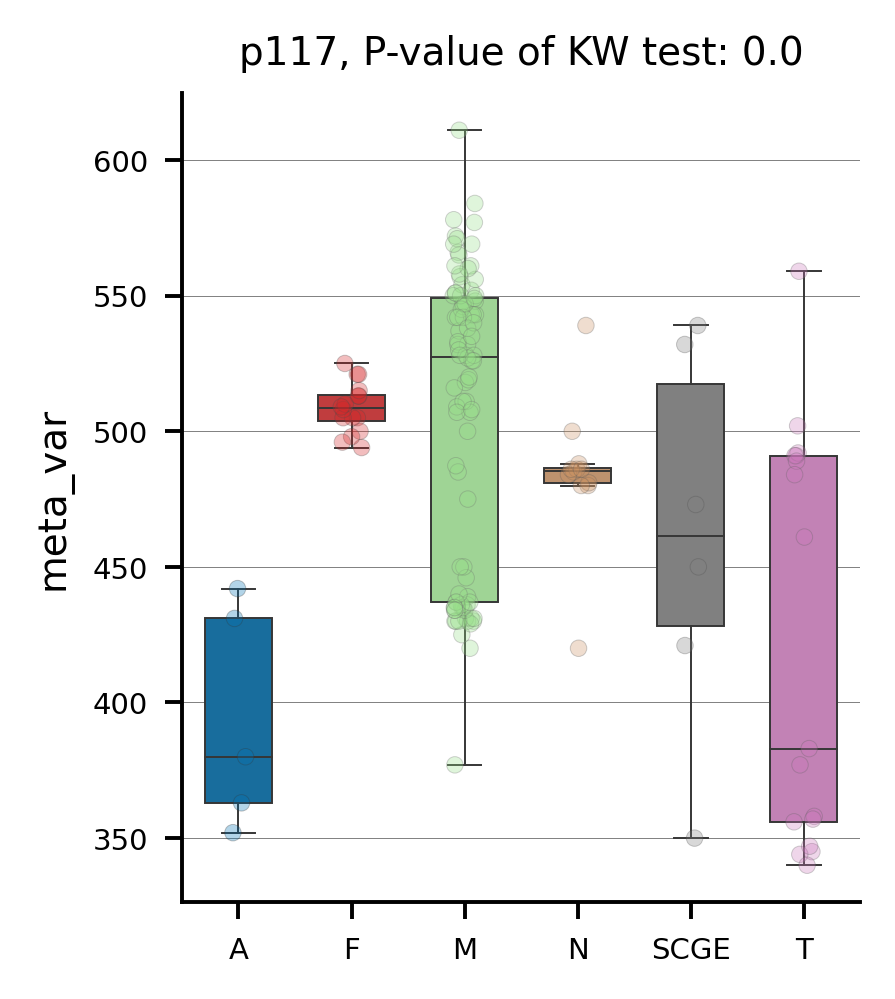

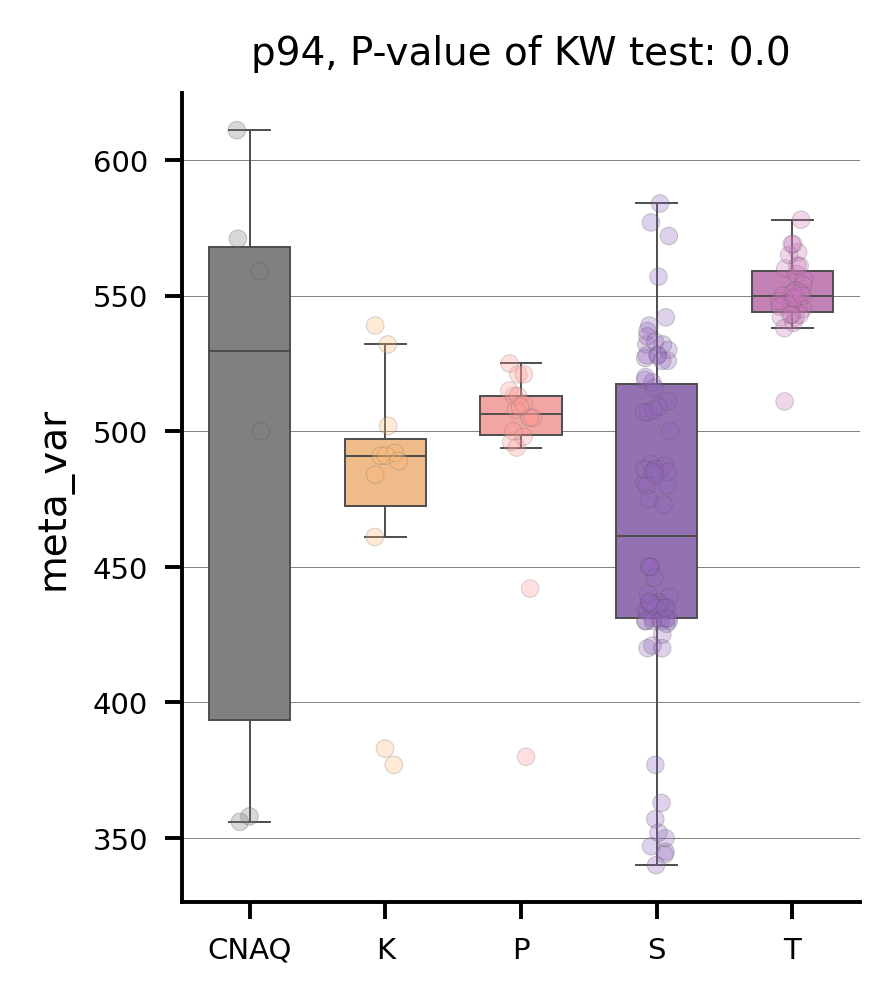

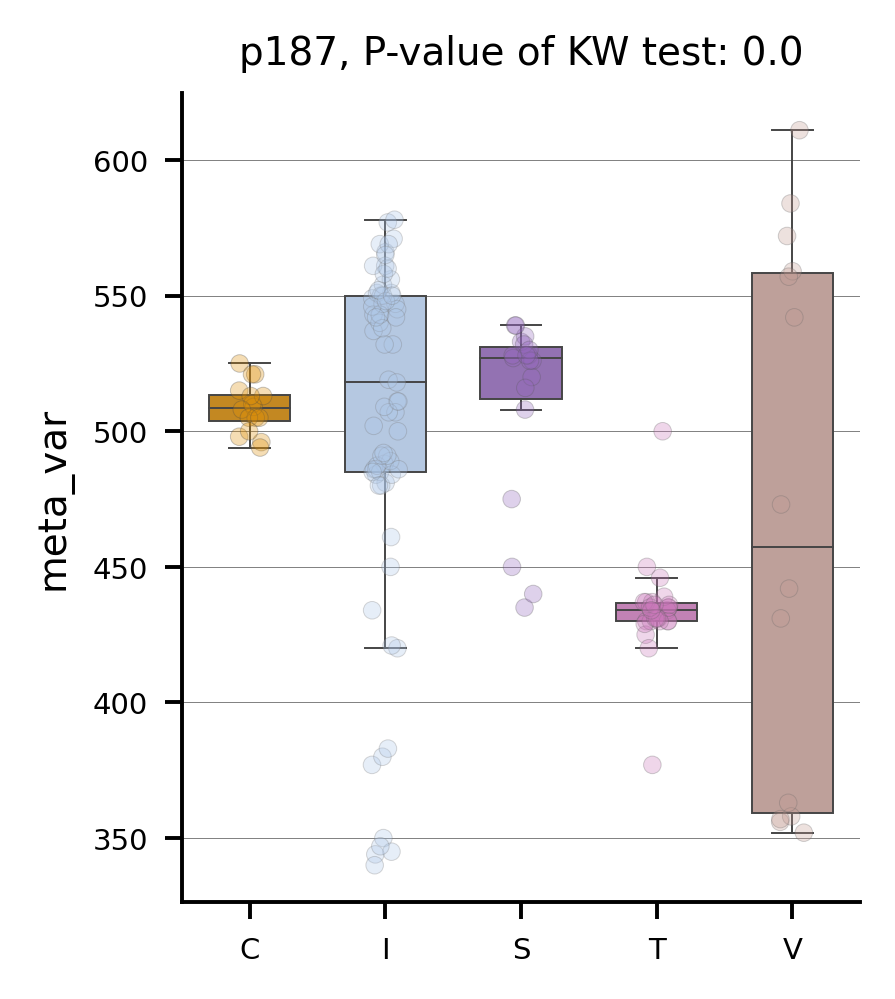

...

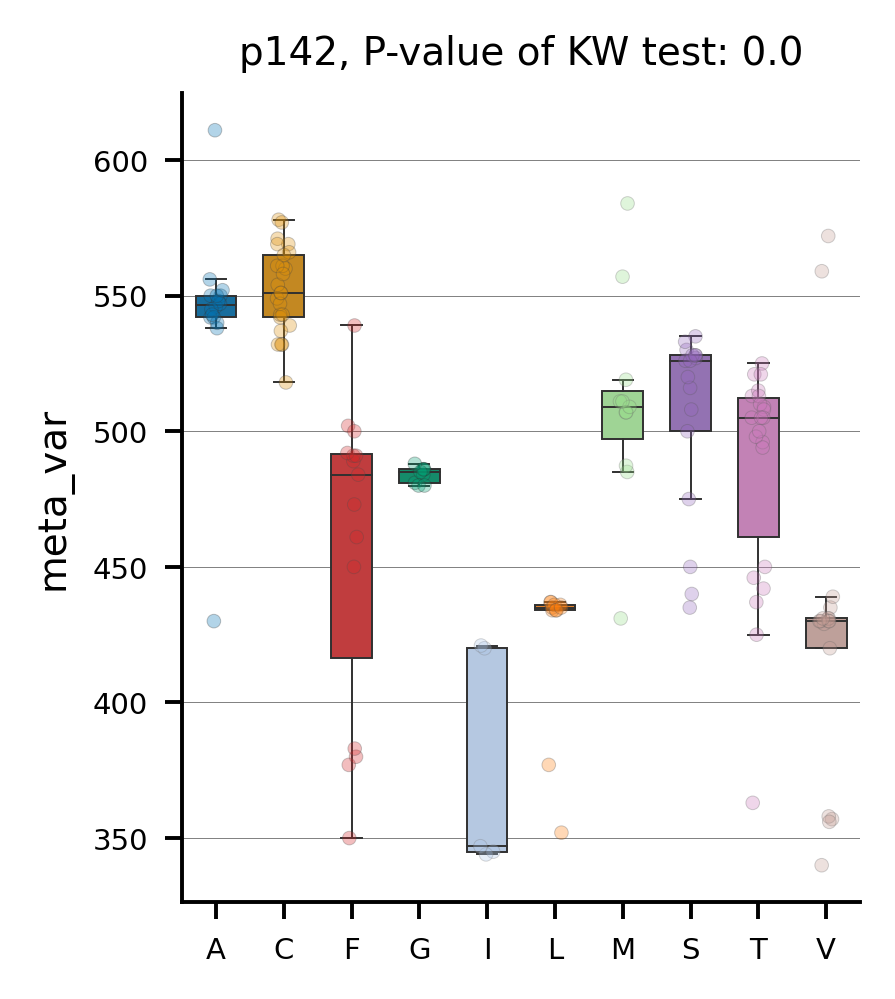

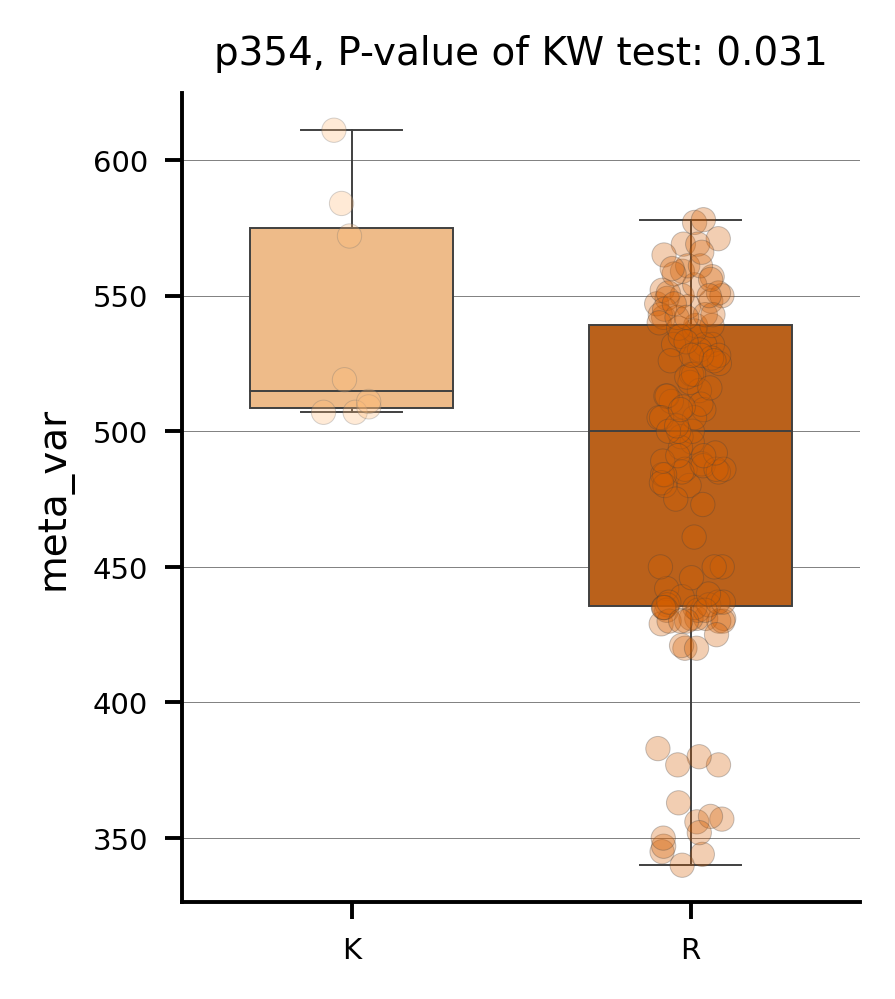

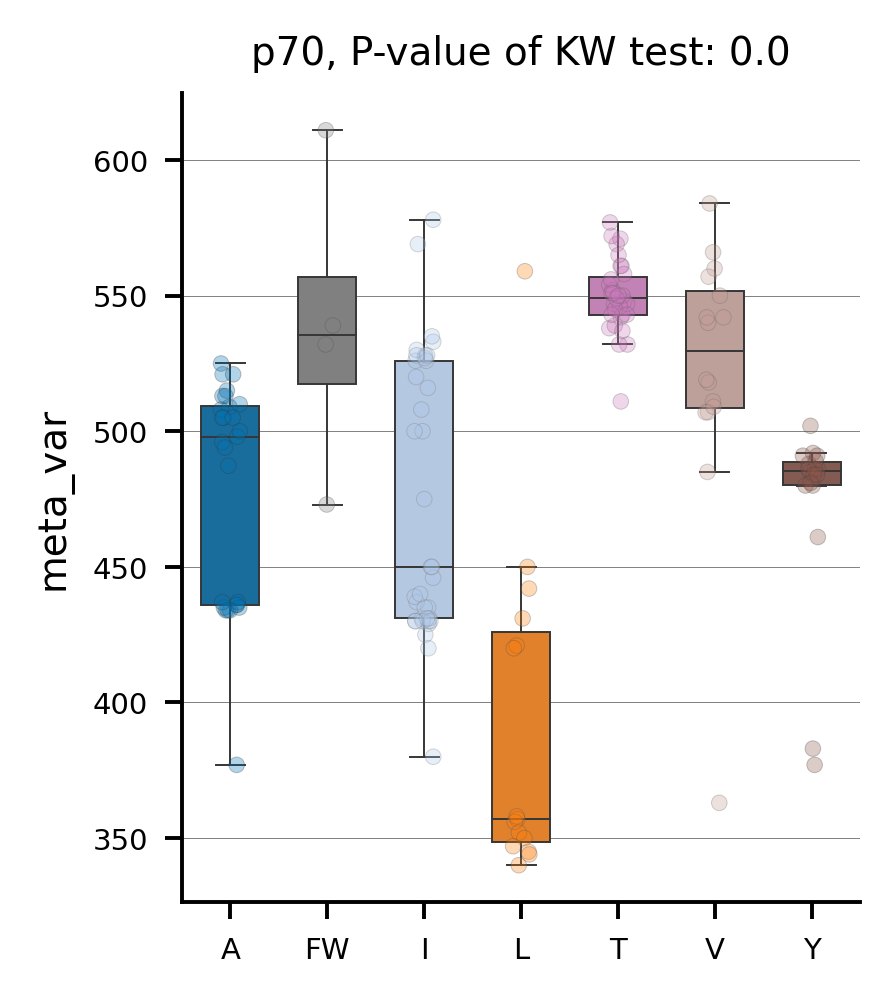

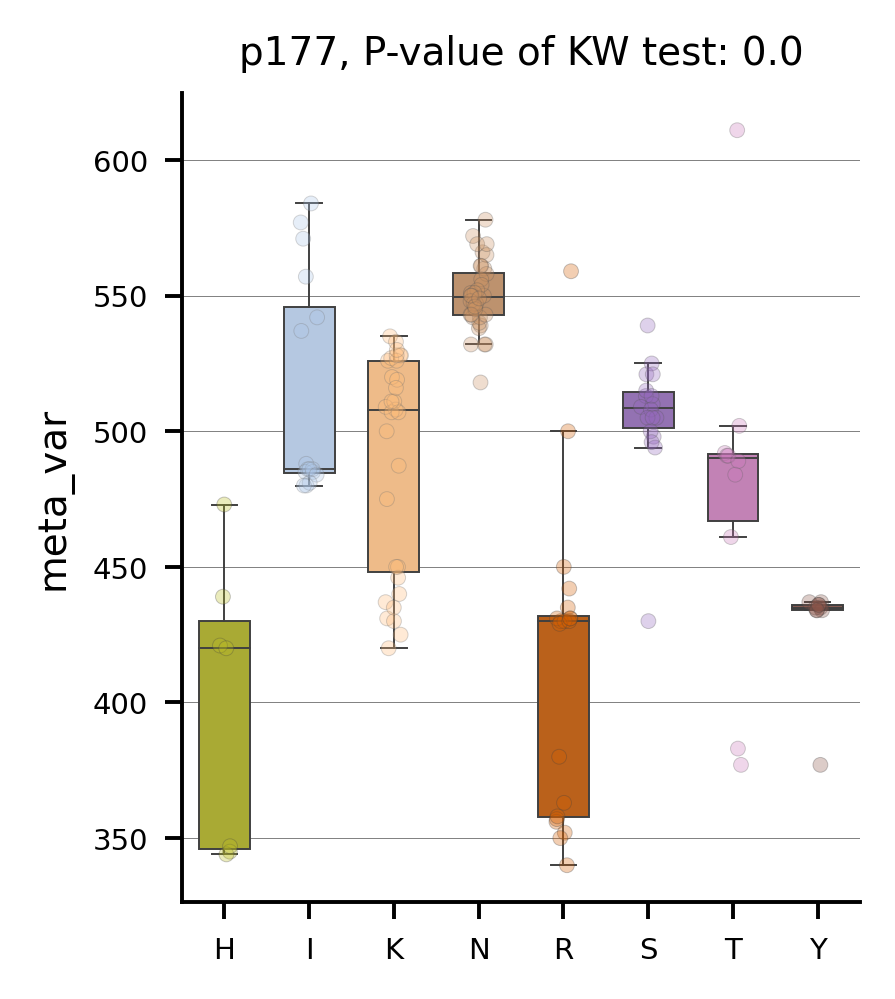

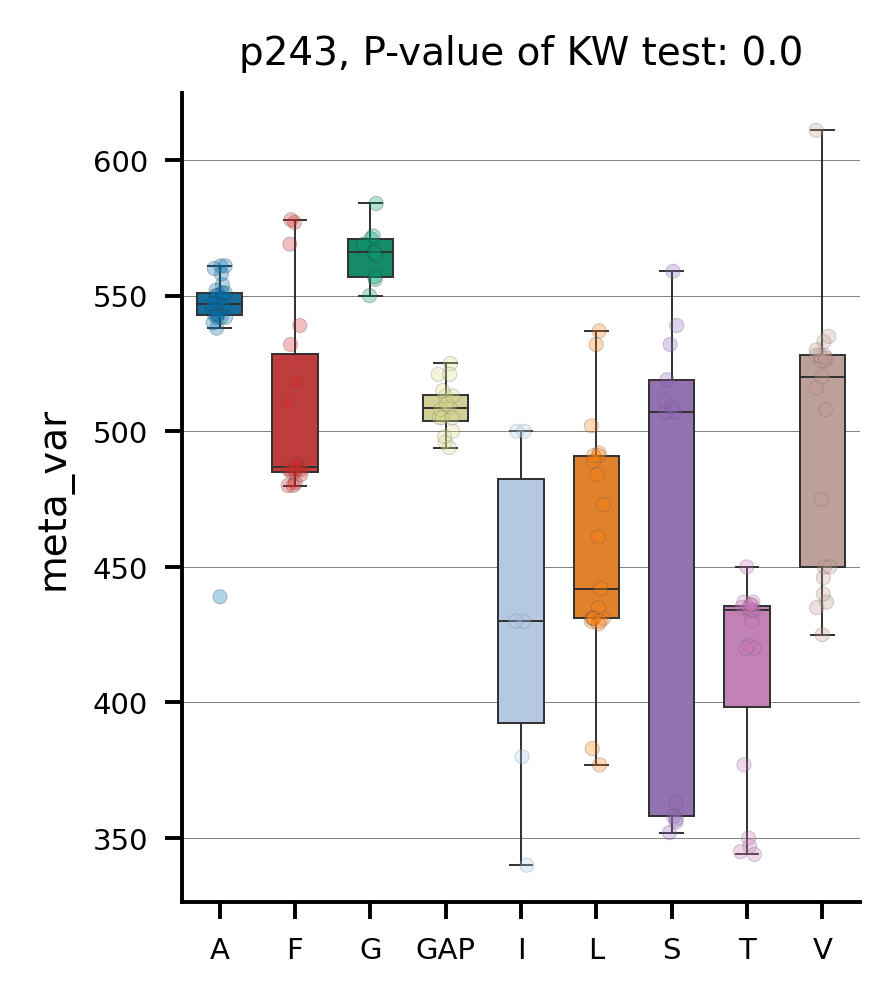

In [44]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  model_type = ana_type,
                  report_dir=report_dir, max_plots=100,
                  figsize=(2.5, 3))

In [45]:
from deepBreaks.utils import load_obj
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error

In [46]:
top_per_mod = report_dir + '/' + mtml[0] + '.pkl'
load_top_mod = load_obj(top_per_mod)

In [47]:
print(f'Here is a list of your top performing models to test...\n{mtml}')

Here is a list of your top performing models to test...
['BayesianRidge', 'rf', 'Lasso']


# <font color=red>STEP 4: Translate Candidate STSs</font> 


In [48]:
import pandas as pd
import os

In [49]:
#STEP 4: Translate Candidate STSs 
#translate candidate STSs to the bovine or squid equivalent 
    #bovine and squid sequence dataframes were saved earlier and are called again here
    m = 0
    tm = ''
    k=0
    gaps=0
    #import importance_report.csv from report_dir
    true_pos = []
    aa = []
    tmd = []
    df = pd.read_csv(f'{report_dir}\importance_report.csv')
    #take the list of important sites and translate them to the bovine standard equivalent, 
    #we do this by taking the site number and subtracting the number of '-' between the start of the sequence and the desired site. 
    for rows in reference_seq.values:  
        rows = str(rows)
        #print(rows)
        if rows == 'nan':
        #We want to write the 'true_pos', 'aa', and 'TMD' to the 'importance_report' csv file
            gaps += 1
            k += 1
            true_pos.append('NA')
            aa.append('-')
            tmd.append('NA')
        else:
            #print("The number of gaps is " + str(gaps))
            k+=1
            trans_site = k - gaps
            if ref_seq_name == 'bovine':
                if trans_site in range(3,37):
                    tm = 'N-Termina'
                elif trans_site in range(37,62):
                    tm = '1'
                elif trans_site in range(74,96):
                    tm = '2'
                elif trans_site in range(111,133):
                    tm = '3'
                elif trans_site in range(153,174):
                    tm = '4'
                elif trans_site in range(203,225):
                    tm = '5'
                elif trans_site in range(253,275):
                    tm = '6'
                elif trans_site in range(287,309):
                    tm = '7'
                else:
                    tm = 'CT/EC'
            else:
                if trans_site in range(3,34):
                    tm = 'N-Termina'
                elif trans_site in range(34,59):
                    tm = '1'
                elif trans_site in range(71,97):
                    tm = '2'
                elif trans_site in range(110,132):
                    tm = '3'
                elif trans_site in range(152,173):
                    tm = '4'
                elif trans_site in range(200,225):
                    tm = '5'
                elif trans_site in range(262,284):
                    tm = '6'
                elif trans_site in range(294,315):
                    tm = '7'
                else:
                    tm = 'CT/EC'                
            
            true_pos.append(str(trans_site))
            aa.append(rows)
            tmd.append(tm)
    true_pos.pop()
    aa.pop()
    tmd.pop()

    df['true_position'] = true_pos
    df['TMD'] = tmd
    df['amino_acid'] = aa
    df.to_csv(path_or_buf= os.path.join(report_dir,r'importance_report.csv'),index = 'Feature',mode="w")
    #df.head()



IndentationError: unexpected indent (1471699085.py, line 4)

# <font color=red>STEP 5: Query the Model to Predict NEW Sequences</font> 
## Takes new sequences, inserts them into existing alignment to properly format for model query, then returns prediction of the λmax value for each sequence...

In [ ]:
import os
import subprocess

i = 0
#path to the mafft.bat file
mafft_exe = mafft_dir
#path to sequences we want to add to an existing alignment [the one we used to train the model] in FASTA format
seq_add = 'mutant_seqs.fasta'
#path to the primary alignment used for training the model - if trying access a specific file later
#seqFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_mut_added_aligned_db_fmt.fasta' 
# path to the corresponding metadata file
#metaDataFileName = './vizphiz_data_splits_2023-08-09_16-39-38/nmoc_meta.tsv' 
#path to the top performing model from model training
#can use method below or enter path manually if coming back to notebook with no variables intialized
top_per_mod = report_dir + '/' + mtml[0] + '.pkl'
load_top_mod = load_obj(top_per_mod)

mut_ali = seqFileName[2:].split("/")[1]
mut_ali = f'{mut_ali.split(".")[0]}_mutant_aligned.fasta'
print(mut_ali)
cmd = [mafft_exe, '--add', seq_add, '--keeplength', seqFileName , '>', f'{report_dir}/{mut_ali}' ]
aligner = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
out_put = aligner.communicate()[0].decode('utf8')

#print(out_put)
mut_test = read_data( f'./{report_dir}/{mut_ali}', seq_type = seq_type, is_main=True, gap_threshold=0.6)
ref_copy = read_data( seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.6)
last_seq = ref_copy.shape[0]
#print(ref_copy.shape)
#print(last_seq)
mut_test = mut_test.iloc[last_seq:].copy()
print(mut_test)

predictions = load_top_mod.predict(mut_test)
print(predictions)
mut_fin = pd.DataFrame(index=mut_test.index)
mut_fin['Prediction'] = predictions
mut_fin.to_csv(path_or_buf= f'{report_dir}/new_mutant_predictions.csv',mode="w")
  

inv_only_aligned_db_fmt_mutant_aligned.fasta


FileNotFoundError: [Errno 2] No such file or directory: './inv_only_aligned_db_fmt_Lambda_Max_2023-09-08_18-35-13/inv_only_aligned_db_fmt_mutant_aligned.fasta'